##  I will visualize the output of the Discrete Wavelet Transformation from coloured images (RGB) in two different forms.
### First I will layer and then I will stack:
#### This means first of all I will recompose the Image out of it R-, G- and B-components into his DWT-coefficients and visualize the outcomes.
#### Second of all I will stack, meaning I stick to the R-, G-  and B-components individually and observe their outcomes but I will stack the zeros accordingly into the matrices, so the I don't see grey, but red, green or blue colours respectively, because as single values in each matrice entry, they will always be interpreted as grey tones.

In [1]:
import numpy as np
import pandas as pd
import os
from PIL import Image
import pywt
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
#Different example pictures to uncomment and to try out:
img_name = 'blue'

Recomposing the dwt-output component by layering:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


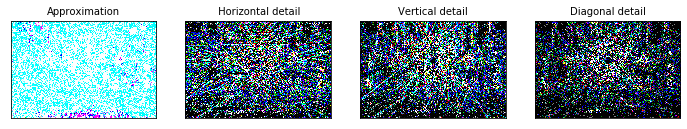

In [3]:
data_img = np.asarray(Image.open(f"data/{img_name}.jpg"))
r = data_img[:,:,0]
g = data_img[:,:,1]
b = data_img[:,:,2]
    
coeff_r = pywt.dwt2(r, 'bior1.3')
coeff_g = pywt.dwt2(g, 'bior1.3')
coeff_b = pywt.dwt2(b, 'bior1.3')
    
LL_r, (LH_r, HL_r, HH_r) = coeff_r
LL_g, (LH_g, HL_g, HH_g) = coeff_g
LL_b, (LH_b, HL_b, HH_b) = coeff_b

LL_all = np.stack((LL_r,LL_g,LL_b),axis=2)
LH_all = np.stack((LH_r,LH_g,LH_b),axis=2)
HL_all = np.stack((HL_r,HL_g,HL_b),axis=2)
HH_all = np.stack((HH_r,HH_g,HH_b),axis=2)

titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
#maybe using subplots looks better and i could visualize them in a square!
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL_all, LH_all, HL_all, HH_all]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
    
#can see details very well in this view
    
#Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
#so better use astype (?)
### TRY Below

#Before layering they also were no ints, but it was no issue.
#Even with astype(int), the issue stays. The problem could also be, that some values are below zero or slightly above 255. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


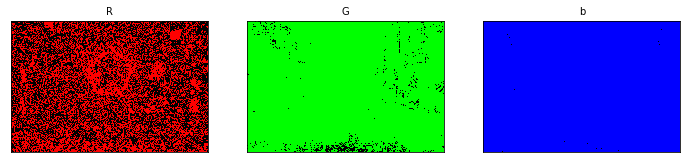

In [19]:
r = data_img[:,:,0]
g = data_img[:,:,1]
b = data_img[:,:,2]
z=np.zeros(r.shape)

r_full=np.stack((r,z,z),axis=2)
g_full=np.stack((z,g,z),axis=2)
b_full=np.stack((z,z,b),axis=2)

titles = ['R', 'G', 'b']
#maybe using subplots looks better and i could visualize them in a square!
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([r_full, g_full, b_full]):
    ax = fig.add_subplot(1, 3, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])

Now again layering but in addition I cast the matrix entries to integers.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


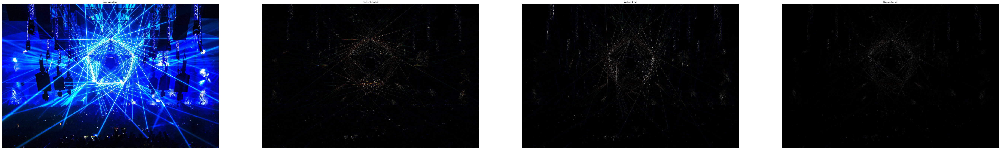

In [4]:
data_img = np.asarray(Image.open(f"data/{img_name}.jpg"))
r = data_img[:,:,0]
g = data_img[:,:,1]
b = data_img[:,:,2]
    
coeff_r = pywt.dwt2(r, 'bior1.3')
coeff_g = pywt.dwt2(g, 'bior1.3')
coeff_b = pywt.dwt2(b, 'bior1.3')
    
LL_r, (LH_r, HL_r, HH_r) = coeff_r
LL_g, (LH_g, HL_g, HH_g) = coeff_g
LL_b, (LH_b, HL_b, HH_b) = coeff_b


titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
fig = plt.figure(figsize=(96, 24))
for i, a in enumerate([LL_all.astype(int), LH_all.astype(int), HL_all.astype(int), HH_all.astype(int)]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
    
#why how would this help to make it colourful?

#Seems that all colours are used correctly
#Maybe lh,hl and hh should stay in grey or something like this.
#also black is not so visible via beamer

#maybe export black ones and e.g. zoom in or change the visualization accordingly to see more of the lines

In [5]:
#was sagen mir die lh hl hh werte, denn ll ist die approx ans bild (aus...?) deswegen sieht sie so aus wie es aussieht, also nah am orig., 
#vielleicht muss man die anderen anders runden, oder so lassen
#werte sind von imshow so interpretierbar?
#eventuell nicht, denn:
#werte von  zb  HL_r sind nicht [0,255]

Now there are 3 visualiszations where we consider R, G and B individually:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

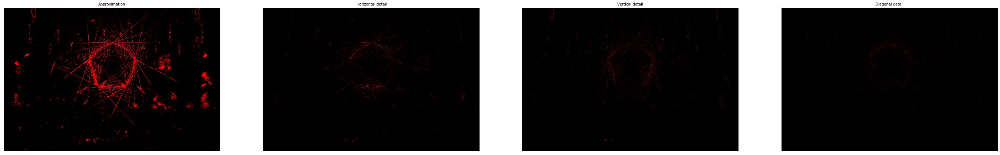

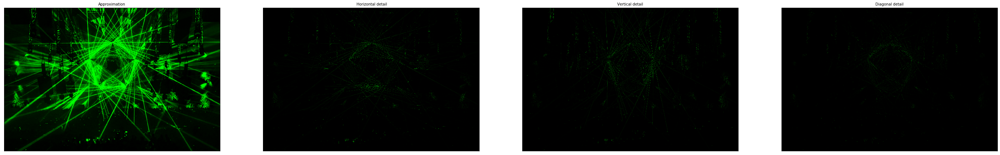

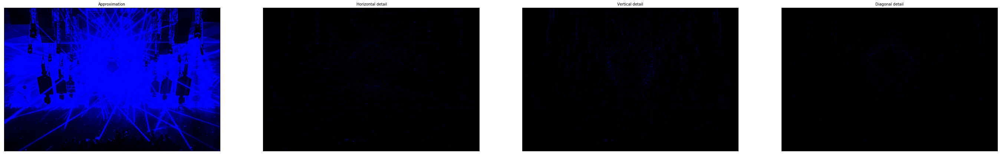

In [6]:
data_img = np.asarray(Image.open(f"data/{img_name}.jpg"))
r = data_img[:,:,0]
g = data_img[:,:,1]
b = data_img[:,:,2]
    
coeff_r = pywt.dwt2(r, 'bior1.3')
coeff_g = pywt.dwt2(g, 'bior1.3')
coeff_b = pywt.dwt2(b, 'bior1.3')
    
LL_r, (LH_r, HL_r, HH_r) = coeff_r
LL_g, (LH_g, HL_g, HH_g) = coeff_g
LL_b, (LH_b, HL_b, HH_b) = coeff_b

#for R:
g_llr_r=b_llr_r=np.zeros(LL_r.shape)
g_lhr_r=b_lhr_r=np.zeros(LH_r.shape)
g_hlr_r=b_hlr_r=np.zeros(HL_r.shape)
g_hhr_r=b_hhr_r=np.zeros(HH_r.shape)
#maybe only convert the LL? let the rest be the same?!

#for G:
r_llr_g=b_llr_g=np.zeros(LL_g.shape)
r_lhr_g=b_lhr_g=np.zeros(LH_g.shape)
r_hlr_g=b_hlr_g=np.zeros(HL_g.shape)
r_hhr_g=b_hhr_g=np.zeros(HH_g.shape)

#for B:
r_llr_b=g_llr_b=np.zeros(LL_b.shape)
r_lhr_b=g_lhr_b=np.zeros(LH_b.shape)
r_hlr_b=g_hlr_b=np.zeros(HL_b.shape)
r_hhr_b=g_hhr_b=np.zeros(HH_b.shape)


LL_real_r=np.stack((LL_r,g_llr_r,b_llr_r),axis=2)
LH_real_r=np.stack((LH_r,g_lhr_r,b_lhr_r),axis=2)
HL_real_r=np.stack((HL_r,g_hlr_r,b_hlr_r),axis=2)
HH_real_r=np.stack((HH_r,g_hhr_r,b_hhr_r),axis=2)

LL_real_g=np.stack((r_llr_g,LL_g,b_llr_g),axis=2)
LH_real_g=np.stack((r_lhr_g,LH_g,b_lhr_g),axis=2)
HL_real_g=np.stack((r_hlr_g,HL_g,b_hlr_g),axis=2)
HH_real_g=np.stack((r_hhr_g,HH_g,b_hhr_g),axis=2)

LL_real_b=np.stack((r_llr_b,g_llr_b,LL_b),axis=2)
LH_real_b=np.stack((r_lhr_b,g_lhr_b,LH_b),axis=2)
HL_real_b=np.stack((r_hlr_b,g_hlr_b,HL_b),axis=2)
HH_real_b=np.stack((r_hhr_b,g_hhr_b,HH_b),axis=2)



titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
fig = plt.figure(figsize=(48, 12))
for i, a in enumerate([LL_real_r.astype(int), LH_real_r.astype(int), HL_real_r.astype(int), HH_real_r.astype(int)]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
    

titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
fig = plt.figure(figsize=(48, 12))
for i, a in enumerate([LL_real_g.astype(int), LH_real_g.astype(int), HL_real_g.astype(int), HH_real_g.astype(int)]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
    
    

titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
fig = plt.figure(figsize=(48, 12))
for i, a in enumerate([LL_real_b.astype(int), LH_real_b.astype(int), HL_real_b.astype(int), HH_real_b.astype(int)]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
    
#funny mistake:
#I dropped them in the wrong order and now my briefkasten is sometimes black.
#I leave this inside my notebook to figure out, what happened later, but having a new try with right arranged stacking np.ndarrays and see my new output, which i expect to be red, green and blue accordingly.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

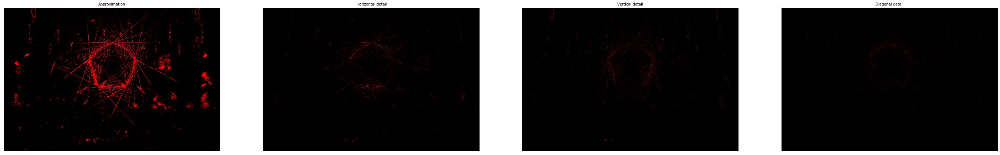

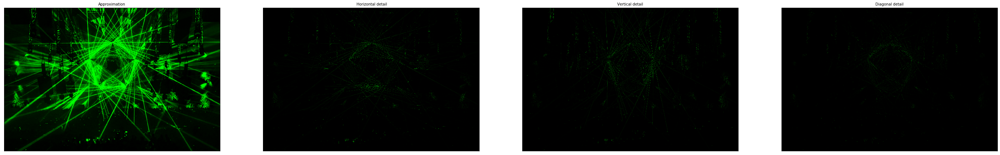

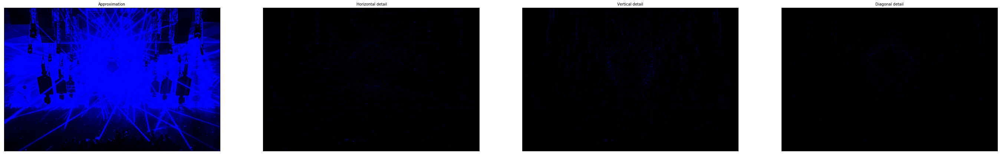

In [7]:
data_img = np.asarray(Image.open(f"data/{img_name}.jpg"))
r = data_img[:,:,0]
g = data_img[:,:,1]
b = data_img[:,:,2]
    
coeff_r = pywt.dwt2(r, 'bior1.3')
coeff_g = pywt.dwt2(g, 'bior1.3')
coeff_b = pywt.dwt2(b, 'bior1.3')
    
LL_r, (LH_r, HL_r, HH_r) = coeff_r
LL_g, (LH_g, HL_g, HH_g) = coeff_g
LL_b, (LH_b, HL_b, HH_b) = coeff_b

#for R:
g_llr_r=b_llr_r=np.zeros(LL_r.shape)
g_lhr_r=b_lhr_r=np.zeros(LH_r.shape)
g_hlr_r=b_hlr_r=np.zeros(HL_r.shape)
g_hhr_r=b_hhr_r=np.zeros(HH_r.shape)
#maybe only convert the LL? let the rest be the same?!

#for G:
r_llr_g=b_llr_g=np.zeros(LL_g.shape) #all the middle r are g (replace and also below but now erstmal egal, bcs shape stimmt)
r_lhr_g=b_lhr_g=np.zeros(LH_g.shape)
r_hlr_g=b_hlr_g=np.zeros(HL_g.shape)
r_hhr_g=b_hhr_g=np.zeros(HH_g.shape)

#for B:
r_llr_b=g_llr_b=np.zeros(LL_b.shape) #all the middle r are b
r_lhr_b=g_lhr_b=np.zeros(LH_b.shape)
r_hlr_b=g_hlr_b=np.zeros(HL_b.shape)
r_hhr_b=g_hhr_b=np.zeros(HH_b.shape)


LL_real_r=np.stack((LL_r,g_llr_r,b_llr_r),axis=2)
LH_real_r=np.stack((LH_r,g_lhr_r,b_lhr_r),axis=2)
HL_real_r=np.stack((HL_r,g_hlr_r,b_hlr_r),axis=2)
HH_real_r=np.stack((HH_r,g_hhr_r,b_hhr_r),axis=2)

LL_real_g=np.stack((r_llr_g,LL_g,b_llr_g),axis=2)
LH_real_g=np.stack((r_lhr_g,LH_g,b_lhr_g),axis=2)
HL_real_g=np.stack((r_hlr_g,HL_g,b_hlr_g),axis=2)
HH_real_g=np.stack((r_hhr_g,HH_g,b_hhr_g),axis=2)

LL_real_b=np.stack((r_llr_b,g_llr_b,LL_b),axis=2)
LH_real_b=np.stack((r_lhr_b,g_lhr_b,LH_b),axis=2)
HL_real_b=np.stack((r_hlr_b,g_hlr_b,HL_b),axis=2)
HH_real_b=np.stack((r_hhr_b,g_hhr_b,HH_b),axis=2)



titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
fig = plt.figure(figsize=(48, 12))
for i, a in enumerate([LL_real_r.astype(int), LH_real_r.astype(int), HL_real_r.astype(int), HH_real_r.astype(int)]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
    

titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
fig = plt.figure(figsize=(48, 12))
for i, a in enumerate([LL_real_g.astype(int), LH_real_g.astype(int), HL_real_g.astype(int), HH_real_g.astype(int)]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
    
    

titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
fig = plt.figure(figsize=(48, 12))
for i, a in enumerate([LL_real_b.astype(int), LH_real_b.astype(int), HL_real_b.astype(int), HH_real_b.astype(int)]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])

In [8]:
#yayyy splitted to RGB
#rehtink why in the briefkasten is black in G & B

In [9]:
#ich fge sie nicht mit concat sondern mache 12 plots

In [10]:
#nach vor kommas gleich lücken

In [11]:
#noising oder so und 1 pixel dazu bei DWT?!

In [12]:
#safe images within python, sd wo hin exportieren kann

In [13]:
#erste ist normale (apprX)
#sparse compression rate picture selection

In [14]:
#shuold rotate briefkasten picture(why is is rotated in the first place?)